<a href="https://colab.research.google.com/github/RabiaEginme/mantarTanima/blob/main/Roboflow_Custom_Detectron2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# How to Train Detectron2 on Custom Objects

This tutorial implements the new [Detectron2 Library](https://ai.facebook.com/blog/-detectron2-a-pytorch-based-modular-object-detection-library-/) by facebook. This notebook shows training on **your own custom objects** for object detection.

It is worth noting that the Detectron2 library goes far beyond object detection, supporting semantic segmentation, keypoint detection, mask, and densepose.


### Accompanying Blog Post

We recommend that you follow along in this notebook while reading the blog post on [how to train Detectron2](https://blog.roboflow.ai/how-to-train-detectron2/), concurrently.

### Steps Covered in this Tutorial

In this tutorial, we will walk through the steps required to train Detectron2 on your custom objects. We use a [public blood cell detection dataset](https://public.roboflow.ai/object-detection/bccd), which is open source and free to use. You can also use this notebook on your own data.

To train our detector we take the following steps:

* Install Detectron2 dependencies
* Download custom Detectron2 object detection data
* Visualize Detectron2 training data
* Write our Detectron2 Training configuration
* Run Detectron2 training
* Evaluate Detectron2 performance
* Run Detectron2 inference on test images



### **About**

[Roboflow](https://roboflow.ai) enables teams to deploy custom computer vision models quickly and accurately. Convert data from to annotation format, assess dataset health, preprocess, augment, and more. It's free for your first 1000 source images.

#### ![Roboflow Workmark](https://i.imgur.com/WHFqYSJ.png)

# Install Detectron2 Dependencies

In [1]:
# install dependencies: (use cu101 because colab has CUDA 10.1)
!pip install -U torch==2.0.1 torchvision==0.15.2 -f https://download.pytorch.org/whl/cu101/torch_stable.html
!pip install cython pyyaml==5.1
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version
# opencv is pre-installed on colab

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://download.pytorch.org/whl/cu101/torch_stable.html
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/cocodataset/cocoapi.git to /tmp/pip-req-build-tabo81n8
  Running command git clone --filter=blob:none --quiet https://github.com/cocodataset/cocoapi.git /tmp/pip-req-build-tabo81n8
  Resolved https://github.com/cocodataset/cocoapi.git to commit 8c9bcc3cf640524c4c20a9c40e89cb6a2f2fa0e9
  Preparing metadata (setup.py) ... done
2.0.1+cu117 True
gcc (Ubuntu 9.4.0-1ubuntu1~20.04.1) 9.4.0
Copyright (C) 2019 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.



In [1]:
# install detectron2:
#!pip install -U detectron2==0.1.3 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html
!pip install -U 'git+https://github.com/facebookresearch/detectron2.git'


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-x7byur70
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-x7byur70
  Resolved https://github.com/facebookresearch/detectron2.git to commit 54dd614e9af66cae49d96cef676de871b38db53c
  Preparing metadata (setup.py) ... done


In [2]:
# You may need to restart your runtime prior to this, to let your installation take effect
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import cv2
import random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from detectron2.data.catalog import DatasetCatalog

# Import and Register Custom Detectron2 Data

In [14]:
#!curl -L "{YOUR LINK HERE}" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip
!curl -L "https://app.roboflow.com/ds/QpP2srGvlH?key=d9F6M1yDxI" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   892  100   892    0     0    185      0  0:00:04  0:00:04 --:--:--   185
100 5227k  100 5227k    0     0   959k      0  0:00:05  0:00:05 --:--:--  9.9M
Archive:  roboflow.zip
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
   creating: test/
 extracting: test/Screenshot_20_png.rf.d08d6245b3db28dc79e9697146b8a575.jpg  
 extracting: test/Screenshot_24_png.rf.a97b2dffccbdbbcf308a9bb2752d409c.jpg  
 extracting: test/Screenshot_25_png.rf.1c60a0c8a84d13ca221f0e0eb9dcda40.jpg  
 extracting: test/Screenshot_29_png.rf.8988c0983abe67aeec15c651cabe8276.jpg  
 extracting: test/Screenshot_36_png.rf.8f705f5cf99efa326e074cd0dee73acb.jpg  
 extracting: test/Screenshot_46_png.rf.cdc69b8a0582f374568fd038fcc469fc.jpg  
 extracting: test/Screenshot_6_png.rf.e4fc367b644a86ddf9f1fe69fd880e3b.jpg  
 extracting: test/Scr

In [27]:
from detectron2.data.datasets import register_coco_instances


register_coco_instances("my_dataset_train2", {}, "/content/train/_annotations.coco.json", "/content/train")
register_coco_instances("my_dataset_val2", {}, "/content/valid/_annotations.coco.json", "/content/valid")
register_coco_instances("my_dataset_test2", {}, "/content/test/_annotations.coco.json", "/content/test")


WARNING [06/13 19:37:31 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[06/13 19:37:31 d2.data.datasets.coco]: Loaded 52 images in COCO format from /content/train/_annotations.coco.json


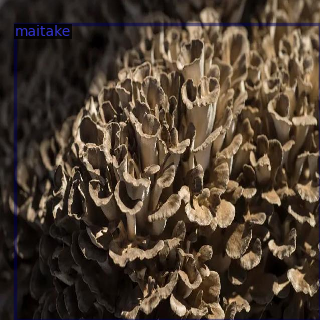

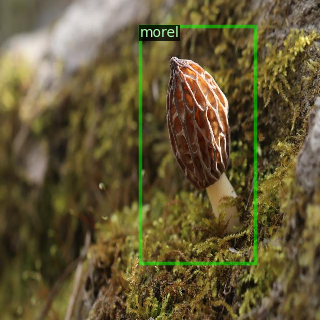

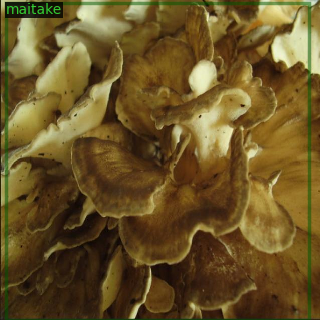

In [28]:
#visualize training data
my_dataset_train_metadata = MetadataCatalog.get("my_dataset_train2")
dataset_dicts = DatasetCatalog.get("my_dataset_train2")

import random
from detectron2.utils.visualizer import Visualizer

for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

# Train Custom Detectron2 Detector

In [29]:
#We are importing our own Trainer Module here to use the COCO validation evaluation during training. Otherwise no validation eval occurs.

from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator

class CocoTrainer(DefaultTrainer):

  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):

    if output_folder is None:
        os.makedirs("coco_eval", exist_ok=True)
        output_folder = "coco_eval"

    return COCOEvaluator(dataset_name, cfg, False, output_folder)

In [31]:
#from .detectron2.tools.train_net import Trainer
#from detectron2.engine import DefaultTrainer
# select from modelzoo here: https://github.com/facebookresearch/detectron2/blob/master/MODEL_ZOO.md#coco-object-detection-baselines

from detectron2.config import get_cfg
#from detectron2.evaluation.coco_evaluation import COCOEvaluator
import os

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train2",)
cfg.DATASETS.TEST = ("my_dataset_val2",)

cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.001


cfg.SOLVER.WARMUP_ITERS = 1000
cfg.SOLVER.MAX_ITER = 1500 #adjust up if val mAP is still rising, adjust down if overfit
cfg.SOLVER.STEPS = (1000, 1499)
cfg.SOLVER.GAMMA = 0.05




cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 4 #your number of classes + 1

cfg.TEST.EVAL_PERIOD = 500


os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = CocoTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[06/13 19:42:22 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_68b088.pkl: 421MB [00:04, 100MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[06/13 19:42:27 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.10/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[06/13 19:43:14 d2.utils.events]:  eta: 0:48:03  iter: 19  total_loss: 2.141  loss_cls: 1.501  loss_box_reg: 0.6432  loss_rpn_cls: 0.003488  loss_rpn_loc: 0.006178    time: 1.9810  last_time: 1.9714  data_time: 0.0387  last_data_time: 0.0259   lr: 1.931e-06  max_mem: 7308M
[06/13 19:44:03 d2.utils.events]:  eta: 0:47:52  iter: 39  total_loss: 2.052  loss_cls: 1.444  loss_box_reg: 0.5721  loss_rpn_cls: 0.004334  loss_rpn_loc: 0.007175    time: 2.0594  last_time: 1.8605  data_time: 0.0294  last_data_time: 0.0367   lr: 2.911e-06  max_mem: 7309M
[06/13 19:44:44 d2.utils.events]:  eta: 0:47:19  iter: 59  total_loss: 1.97  loss_cls: 1.363  loss_box_reg: 0.5935  loss_rpn_cls: 0.002006  loss_rpn_loc: 0.006424    time: 2.0487  last_time: 2.1674  data_time: 0.0276  last_data_time: 0.0226   lr: 3.891e-06  max_mem: 7309M
[06/13 19:45:25 d2.utils.events]:  eta: 0:47:49  iter: 79  total_loss: 1.815  loss_cls: 1.253  loss_box_reg: 0.537  loss_rpn_cls: 0.002069  loss_rpn_loc: 0.008312    time: 2.0492 

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[06/13 19:59:28 d2.evaluation.evaluator]: Inference done 11/15. Dataloading: 0.0015 s/iter. Inference: 0.1867 s/iter. Eval: 0.0003 s/iter. Total: 0.1885 s/iter. ETA=0:00:00
[06/13 19:59:29 d2.evaluation.evaluator]: Total inference time: 0:00:02.003241 (0.200324 s / iter per device, on 1 devices)
[06/13 19:59:29 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:01 (0.186057 s / iter per device, on 1 devices)
[06/13 19:59:29 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[06/13 19:59:29 d2.evaluation.coco_evaluation]: Saving results to coco_eval/coco_instances_results.json
[06/13 19:59:29 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[06/13 19:59:29 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[06/13 19:59:29 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.02 seconds.
[06/13 19:59:29 d2.evaluation

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[06/13 20:16:18 d2.evaluation.evaluator]: Inference done 11/15. Dataloading: 0.0024 s/iter. Inference: 0.1872 s/iter. Eval: 0.0004 s/iter. Total: 0.1900 s/iter. ETA=0:00:00
[06/13 20:16:19 d2.evaluation.evaluator]: Total inference time: 0:00:02.049444 (0.204944 s / iter per device, on 1 devices)
[06/13 20:16:19 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:01 (0.187219 s / iter per device, on 1 devices)
[06/13 20:16:19 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[06/13 20:16:19 d2.evaluation.coco_evaluation]: Saving results to coco_eval/coco_instances_results.json
[06/13 20:16:19 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[06/13 20:16:19 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[06/13 20:16:19 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.01 seconds.
[06/13 20:16:19 d2.evaluation

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[06/13 20:33:16 d2.evaluation.evaluator]: Inference done 11/15. Dataloading: 0.0011 s/iter. Inference: 0.1833 s/iter. Eval: 0.0003 s/iter. Total: 0.1846 s/iter. ETA=0:00:00
[06/13 20:33:17 d2.evaluation.evaluator]: Total inference time: 0:00:01.970644 (0.197064 s / iter per device, on 1 devices)
[06/13 20:33:17 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:01 (0.183370 s / iter per device, on 1 devices)
[06/13 20:33:17 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[06/13 20:33:17 d2.evaluation.coco_evaluation]: Saving results to coco_eval/coco_instances_results.json
[06/13 20:33:17 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[06/13 20:33:17 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[06/13 20:33:17 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.01 seconds.
[06/13 20:33:17 d2.evaluation

In [32]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

In [35]:
#test evaluation
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.85
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("my_dataset_test2", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "my_dataset_test2")
inference_on_dataset(trainer.model, val_loader, evaluator)

[06/13 20:35:56 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...
WARNING [06/13 20:35:57 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
WARNING [06/13 20:35:57 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[06/13 20:35:57 d2.data.datasets.coco]: Loaded 13 images in COCO format from /content/test/_annotations.coco.json
[06/13 20:35:57 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[06/13 20:35:57 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[06/13 20:35:57 d2.data.common]: Serializing 13 elements to byte tensors and concatenating them all ...
[06/13 20:35:57 d2.data.common]: Serialized dataset takes 

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[06/13 20:36:00 d2.evaluation.evaluator]: Inference done 11/13. Dataloading: 0.0011 s/iter. Inference: 0.1866 s/iter. Eval: 0.0004 s/iter. Total: 0.1880 s/iter. ETA=0:00:00
[06/13 20:36:00 d2.evaluation.evaluator]: Total inference time: 0:00:01.642995 (0.205374 s / iter per device, on 1 devices)
[06/13 20:36:00 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:01 (0.186078 s / iter per device, on 1 devices)
[06/13 20:36:00 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[06/13 20:36:00 d2.evaluation.coco_evaluation]: Saving results to ./output/coco_instances_results.json
[06/13 20:36:00 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[06/13 20:36:00 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[06/13 20:36:00 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.01 seconds.
[06/13 20:36:00 d2.evaluation.

OrderedDict([('bbox',
              {'AP': 54.0016501650165,
               'AP50': 70.87458745874588,
               'AP75': 58.4983498349835,
               'APs': nan,
               'APm': nan,
               'APl': 54.0016501650165,
               'AP-mush': nan,
               'AP-maitake': 70.16501650165014,
               'AP-morel': 80.0,
               'AP-olum': 65.84158415841584,
               'AP-panter': 0.0})])

# Inference with Detectron2 Saved Weights



In [54]:
import os
os.environ['LC_ALL'] = 'tr_TR.UTF-8'
os.environ['LANG'] = 'tr_TR.UTF-8'

In [60]:
import locale
def getpreferredencoding(do_setlocale = True):
    return "UTF-8"
locale.getpreferredencoding = getpreferredencoding

In [56]:
import os
os.listdir('./output/')

['last_checkpoint',
 'metrics.json',
 'events.out.tfevents.1686685400.5df8a3396eea.7483.0',
 'coco_instances_results.json',
 'instances_predictions.pth',
 'model_final.pth']

In [61]:
%ls ./output/

/bin/bash: warning: setlocale: LC_ALL: cannot change locale (tr_TR.UTF-8)
coco_instances_results.json                         last_checkpoint
events.out.tfevents.1686685400.5df8a3396eea.7483.0  metrics.json
instances_predictions.pth                           model_final.pth


In [62]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.DATASETS.TEST = ("my_dataset_test2", )
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set the testing threshold for this model
predictor = DefaultPredictor(cfg)
test_metadata = MetadataCatalog.get("my_dataset_test2")

[06/13 20:50:53 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


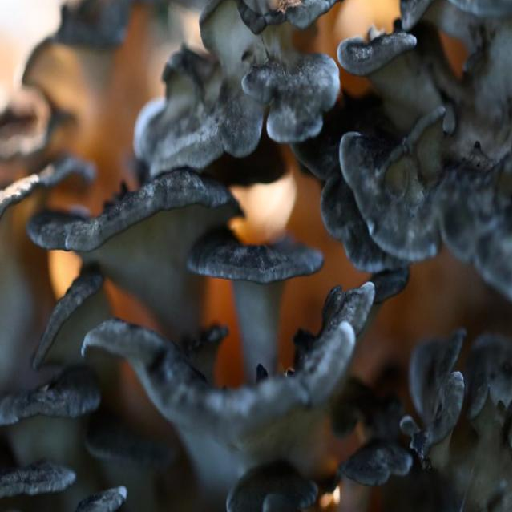

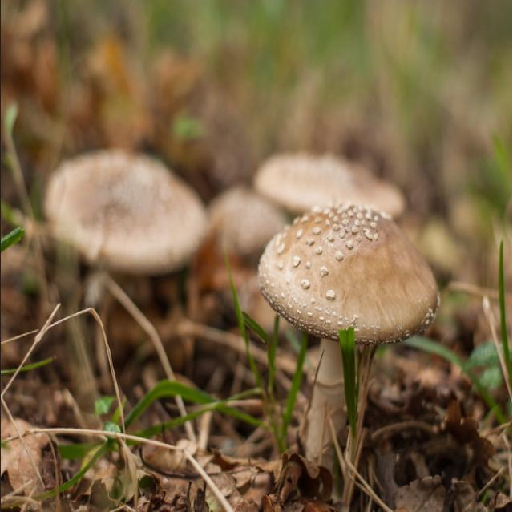

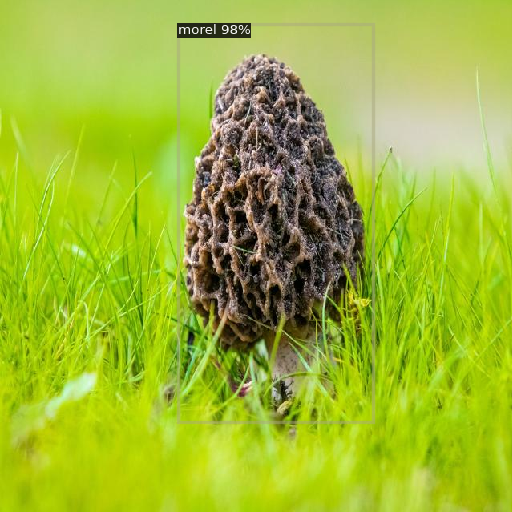

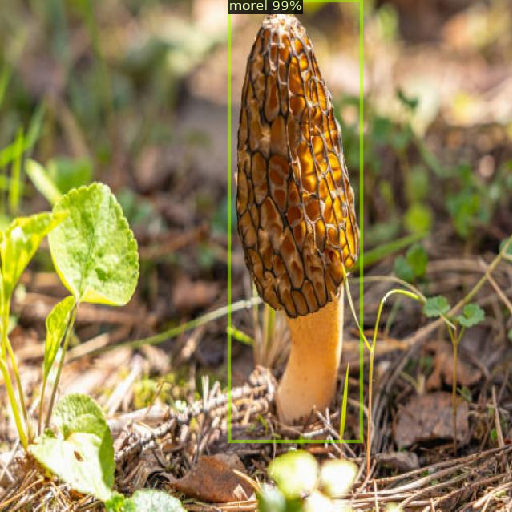

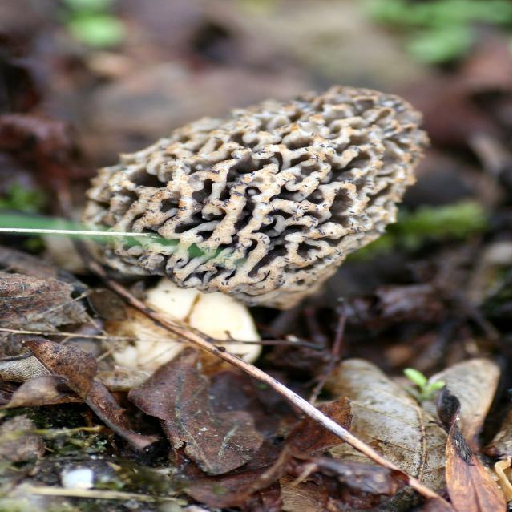

...

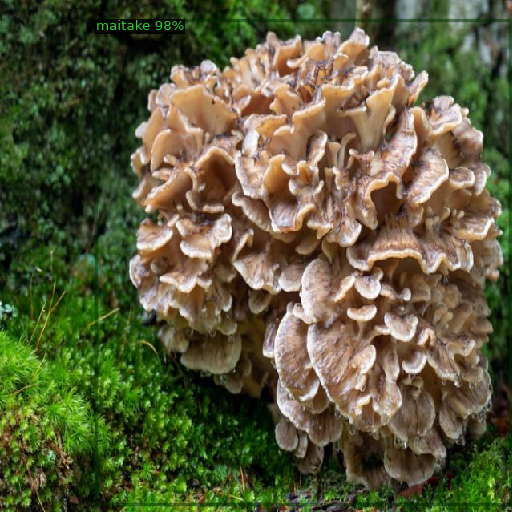

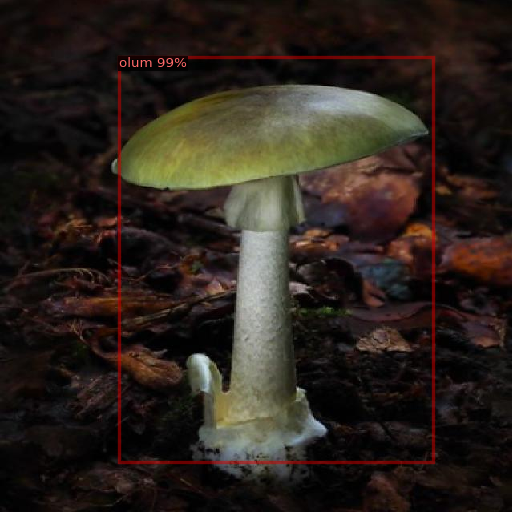

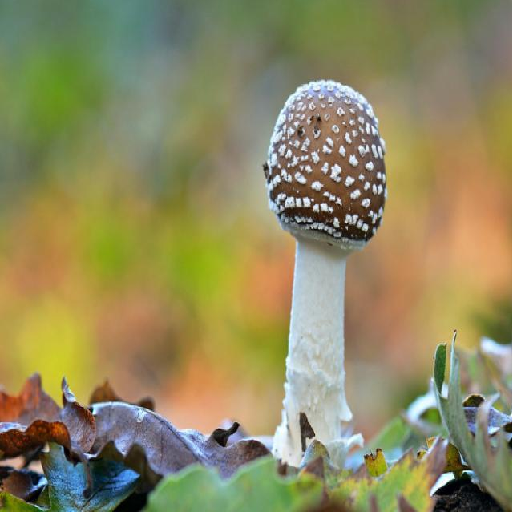

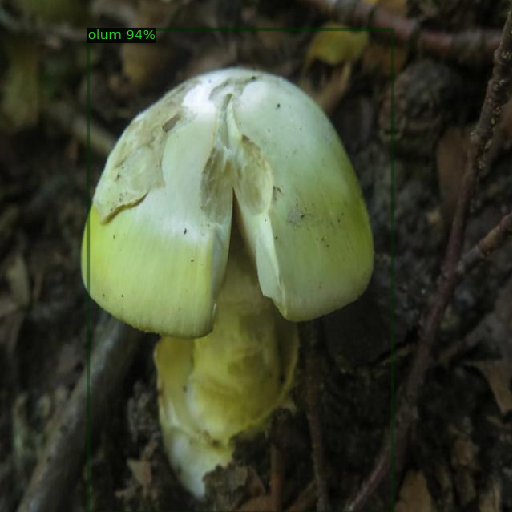

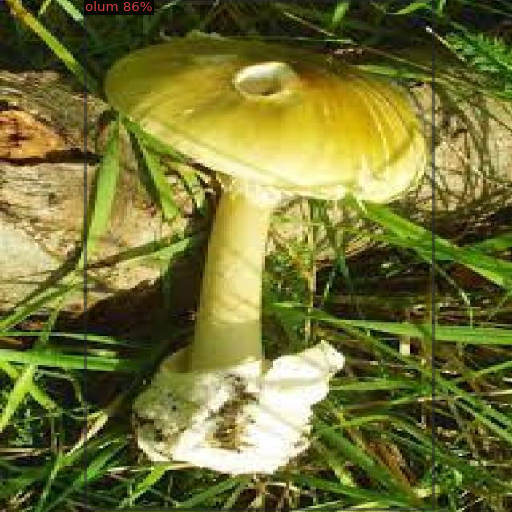

In [63]:
from detectron2.utils.visualizer import ColorMode
import glob

for imageName in glob.glob('/content/test/*jpg'):
  im = cv2.imread(imageName)
  outputs = predictor(im)
  v = Visualizer(im[:, :, ::-1],
                metadata=test_metadata,
                scale=0.8
                 )
  out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
  cv2_imshow(out.get_image()[:, :, ::-1])
